In [9]:
import numpy as np

# 파일 경로 설정
file1 = "gopro.txt"  # 첫 번째 파일 경로
file2 = "gopro_reversed.txt"  # 두 번째 파일 경로

# 파일 읽기 함수
def read_scores(file_path):
    psnr = []
    ssim = []
    with open(file_path, 'r') as file:
        for line in file:
            psnr_val, ssim_val = map(float, line.strip().split('_'))
            psnr.append(psnr_val)
            ssim.append(ssim_val)
    return psnr, ssim

# 두 파일에서 점수 읽기
psnr1, ssim1 = read_scores(file1)
psnr2, ssim2 = read_scores(file2)

# PSNR 기준으로 더 높은 값을 선택하고, 해당하는 SSIM 값도 선택
higher_psnr = []
higher_ssim = []

cnt = 0
for p1, s1, p2, s2 in zip(psnr1, ssim1, psnr2, ssim2):
    if p1 >= p2:
        higher_psnr.append(p1)
        higher_ssim.append(s1)
    else:
        cnt += 1
        higher_psnr.append(p2)
        higher_ssim.append(s2)

# 평균 PSNR과 SSIM 계산
average_psnr = np.mean(higher_psnr)
average_ssim = np.mean(higher_ssim)

# 결과 출력
print(f"Average PSNR: {average_psnr:.4f}")
print(f"Average SSIM: {average_ssim:.4f}")
print(f'Reverse win {cnt}')

Average PSNR: 32.2646
Average SSIM: 0.9560
Reverse win 487


In [2]:
import numpy as np
from PIL import Image

def caculate_PSNR(sharp_path, blur_path):
    img1 = Image.open(sharp_path).convert('RGB')
    img2 = Image.open(blur_path).convert('RGB')

    img1 = np.array(img1).astype(np.float64)
    img2 = np.array(img2).astype(np.float64)

    

    # MSE 계산
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        # 두 이미지가 완전히 동일한 경우
        return float('inf')

    # 최대 픽셀 값
    max_pixel = 1. if img1.max() <= 1 else 255.

    # PSNR 계산
    psnr = 20. * np.log10(max_pixel / np.sqrt(mse))
    
    # print(psnr)
    return psnr

# HIDE

In [2]:
ours = '/workspace/FFTformer/results/HIDE/NAFNet_event_gen/106fromGOPR1087.MP4.png/out.png'
NAF_out = '/workspace/FFTformer/results/HIDE/NAFNet/106fromGOPR1087.MP4.png/out.png'

gt = '/workspace/data/HIDE_dataset/GT/106fromGOPR1087.MP4.png'

ours_psnr = caculate_PSNR(ours,gt)
NAF_psnr = caculate_PSNR(NAF_out,gt)

print(ours_psnr, NAF_psnr)

28.06730630572309 28.483868083768293


In [7]:
## Restormer: Efficient Transformer for High-Resolution Image Restoration
## Syed Waqas Zamir, Aditya Arora, Salman Khan, Munawar Hayat, Fahad Shahbaz Khan, and Ming-Hsuan Yang
## https://arxiv.org/abs/2111.09881

import os
import numpy as np
from skimage import io
import cv2
from skimage.metrics import structural_similarity
from tqdm import tqdm
import concurrent.futures

def image_align(deblurred, gt):
  # this function is based on kohler evaluation code
  z = deblurred
  c = np.ones_like(z)
  x = gt

  zs = (np.sum(x * z) / np.sum(z * z)) * z # simple intensity matching

  warp_mode = cv2.MOTION_HOMOGRAPHY
  warp_matrix = np.eye(3, 3, dtype=np.float32)

  # Specify the number of iterations.
  number_of_iterations = 100

  termination_eps = 0

  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT,
              number_of_iterations, termination_eps)

  # Run the ECC algorithm. The results are stored in warp_matrix.
  (cc, warp_matrix) = cv2.findTransformECC(cv2.cvtColor(x, cv2.COLOR_RGB2GRAY), cv2.cvtColor(zs, cv2.COLOR_RGB2GRAY), warp_matrix, warp_mode, criteria, inputMask=None, gaussFiltSize=5)

  target_shape = x.shape
  shift = warp_matrix

  zr = cv2.warpPerspective(
    zs,
    warp_matrix,
    (target_shape[1], target_shape[0]),
    flags=cv2.INTER_CUBIC+ cv2.WARP_INVERSE_MAP,
    borderMode=cv2.BORDER_REFLECT)

  cr = cv2.warpPerspective(
    np.ones_like(zs, dtype='float32'),
    warp_matrix,
    (target_shape[1], target_shape[0]),
    flags=cv2.INTER_NEAREST+ cv2.WARP_INVERSE_MAP,
    borderMode=cv2.BORDER_CONSTANT,
    borderValue=0)

  zr = zr * cr
  xr = x * cr

  return zr, xr, cr, shift

def compute_psnr(image_true, image_test, image_mask, data_range=None):
  # this function is based on skimage.metrics.peak_signal_noise_ratio
  err = np.sum((image_true - image_test) ** 2, dtype=np.float64) / np.sum(image_mask)
  return 10 * np.log10((data_range ** 2) / err)


def compute_ssim(tar_img, prd_img, cr1):
    min_dimension = min(tar_img.shape[0], tar_img.shape[1])
    win_size = min(7, min_dimension)  # Ensure win_size does not exceed the image dimensions

    ssim_pre, ssim_map = structural_similarity(
        tar_img, prd_img, multichannel=True, gaussian_weights=True,
        use_sample_covariance=False, data_range=1.0, full=True, win_size=win_size, channel_axis=-1
    )
    ssim_map = ssim_map * cr1

    r = int(3.5 * 1.5 + 0.5)  # Radius as in ndimage
    win_size = 2 * r + 1
    pad = (win_size - 1) // 2

    ssim = ssim_map[pad:-pad, pad:-pad, :]
    crop_cr1 = cr1[pad:-pad, pad:-pad, :]
    ssim = ssim.sum(axis=0).sum(axis=0) / crop_cr1.sum(axis=0).sum(axis=0)
    ssim = np.mean(ssim)
    return ssim

def proc(filename):
    tar,prd = filename
    tar_img = io.imread(tar)
    prd_img = io.imread(prd)
    
    tar_img = tar_img.astype(np.float32)/255.0
    prd_img = prd_img.astype(np.float32)/255.0
    
    prd_img, tar_img, cr1, shift = image_align(prd_img, tar_img)

    PSNR = compute_psnr(tar_img, prd_img, cr1, data_range=1)
    SSIM = compute_ssim(tar_img, prd_img, cr1)
    with open('realblur-J_result.txt', 'a') as f:
       img_name = filename[0].split('/')[-1]
       f.write(f'{img_name}_{PSNR}\n')

    return (PSNR, SSIM)



def realblur_metric(gt_path_list, out_path_list):
    
    psnr, ssim = [], []
    img_files =[(i, j) for i,j in zip(gt_path_list,out_path_list)]
    with concurrent.futures.ProcessPoolExecutor(max_workers=10) as executor:
        results = list(tqdm(executor.map(proc, img_files), total=len(img_files)))

    for PSNR_SSIM in results:
        psnr.append(PSNR_SSIM[0])
        ssim.append(PSNR_SSIM[1])

    avg_psnr = sum(psnr)/len(psnr)
    avg_ssim = sum(ssim)/len(ssim)

    return avg_psnr, avg_ssim

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

scene = 'scene155'
index = '11'

NAF_path = f'/workspace/FFTformer/results/RealBlur-J/NAFNet/{scene}_blur_{index}.png/out.png'
NAF_ours_path = f'/workspace/FFTformer/results/RealBlur-J/EB_NAFNet_1e-3/{scene}_blur_{index}.png/out.png'

fft_path = f'/workspace/FFTformer/results/RealBlur-J/FFTformer/{scene}_blur_{index}.png/out.png'
ours_path = f'/workspace/FFTformer/results/RealBlur-J/FFTformer_event_gen_fftloss/{scene}_blur_{index}.png/out.png'

gt_path = f'/workspace/data/RealBlur/RealBlur-J_ECC_IMCORR_centroid_itensity_ref/{scene}/gt/gt_{index}.png'
blur_path = gt_path.replace('gt','blur')

gt_paths = [gt_path]
fft_paths = [fft_path]
ours_paths = [ours_path]

NAF_paths = [NAF_path]
NAF_ours_paths = [NAF_ours_path]

fft_psnr, fft_ssim = realblur_metric([gt_path], [fft_path])
fft_ours_psnr, fft_ours_ssim = realblur_metric([gt_path], [ours_path])
NAF_psnr, NAF_ssim = realblur_metric([gt_path], [NAF_path])
NAF_ours_psnr, NAF_ours_ssim = realblur_metric([gt_path], [NAF_ours_path])


gt_img = Image.open(gt_path).convert('RGB')
fft_img = Image.open(fft_path).convert('RGB')
ours_img = Image.open(ours_path).convert('RGB')
blur_img = Image.open(blur_path).convert('RGB')
NAF_img = Image.open(NAF_path).convert('RGB')
NAF_ours_img = Image.open(NAF_ours_path).convert('RGB')
gt_img.save('gt.png')

# Define the box coordinates (x, y, width, height)
box_coords = [130,10, 200, 200]  # Adjust these values as needed

# Convert PIL images to numpy arrays
gt_arr = np.array(gt_img)
fft_arr = np.array(fft_img) 
ours_arr = np.array(ours_img)
blur_arr = np.array(blur_img)
NAF_arr = np.array(NAF_img)
NAF_ours_arr = np.array(NAF_ours_img)

# Crop the regions
x, y, w, h = box_coords
gt_crop = gt_arr[y:y+h, x:x+w]
fft_crop = fft_arr[y:y+h, x:x+w]
ours_crop = ours_arr[y:y+h, x:x+w]
blur_crop = blur_arr[y:y+h, x:x+w]
NAF_crop = NAF_arr[y:y+h, x:x+w]
NAF_ours_crop = NAF_ours_arr[y:y+h, x:x+w]

fig, axes = plt.subplots(2, 3, figsize=(15, 12))

# Plot full images with boxes
axes[0,0].imshow(NAF_img)
axes[0,0].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[0,0].set_title(f'NAFNet ({NAF_psnr:.3f})')
axes[0,0].axis('off')

axes[1,0].imshow(NAF_ours_img)
axes[1,0].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[1,0].set_title(f'NAF backbone Ours ({NAF_ours_psnr:.3f})')
axes[1,0].axis('off')


axes[0,1].imshow(fft_img)
axes[0,1].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[0,1].set_title(f'FFTformer ({fft_psnr:.3f})')
axes[0,1].axis('off')

axes[1,1].imshow(ours_img)
axes[1,1].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[1,1].set_title(f'FFTformer backbone Ours ({fft_ours_psnr:.3f})')
axes[1,1].axis('off')

axes[0,2].imshow(blur_img)
axes[0,2].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[0,2].set_title(f'Blur ({scene}_{index})')
axes[0,2].axis('off')

axes[1,2].imshow(gt_img)
axes[1,2].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[1,2].set_title('Ground Truth')
axes[1,2].axis('off')

plt.tight_layout()
plt.show()

# Plot cropped regions
fig, axes = plt.subplots(2, 3, figsize=(15, 15))
axes[0,0].imshow(NAF_crop)
axes[0,0].set_title(f'NAFNet (cropped)')
axes[0,0].axis('off')

axes[1,0].imshow(NAF_ours_crop)
axes[1,0].set_title(f'NAFNet backbone Ours (cropped)')
axes[1,0].axis('off')

axes[0,1].imshow(fft_crop)
axes[0,1].set_title(f'FFTformer (cropped)')
axes[0,1].axis('off')

axes[1,1].imshow(ours_crop)
axes[1,1].set_title(f'FFTformer backbone Ours (cropped)')
axes[1,1].axis('off')

axes[0,2].imshow(blur_crop)
axes[0,2].set_title(f'Blur (cropped)')
axes[0,2].axis('off')

axes[1,2].imshow(gt_crop)
axes[1,2].set_title('Ground Truth (cropped)')
axes[1,2].axis('off')

plt.tight_layout()
plt.show()


# REDS plot

In [17]:
gt_path

'/workspace/data/REDS/val/val_sharp/005/00000091.png'

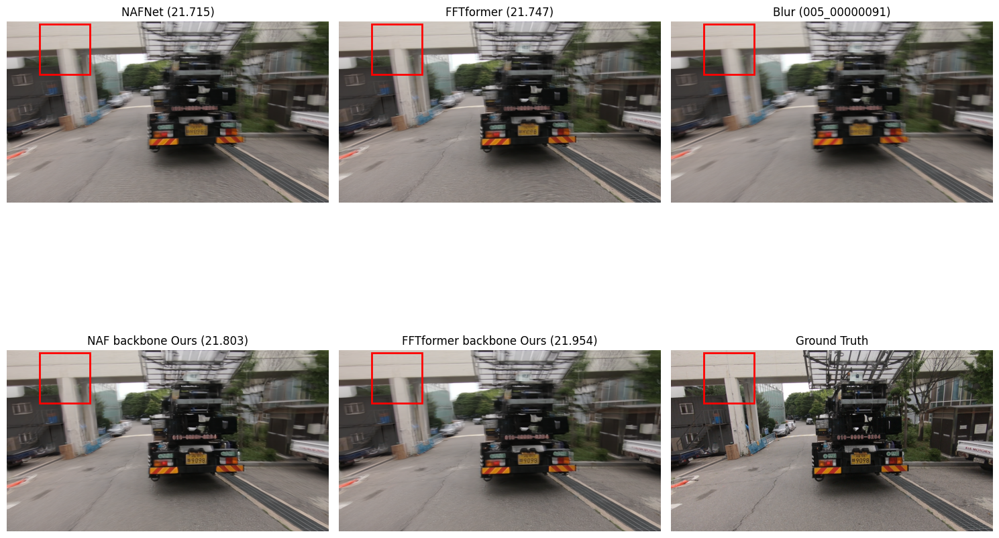

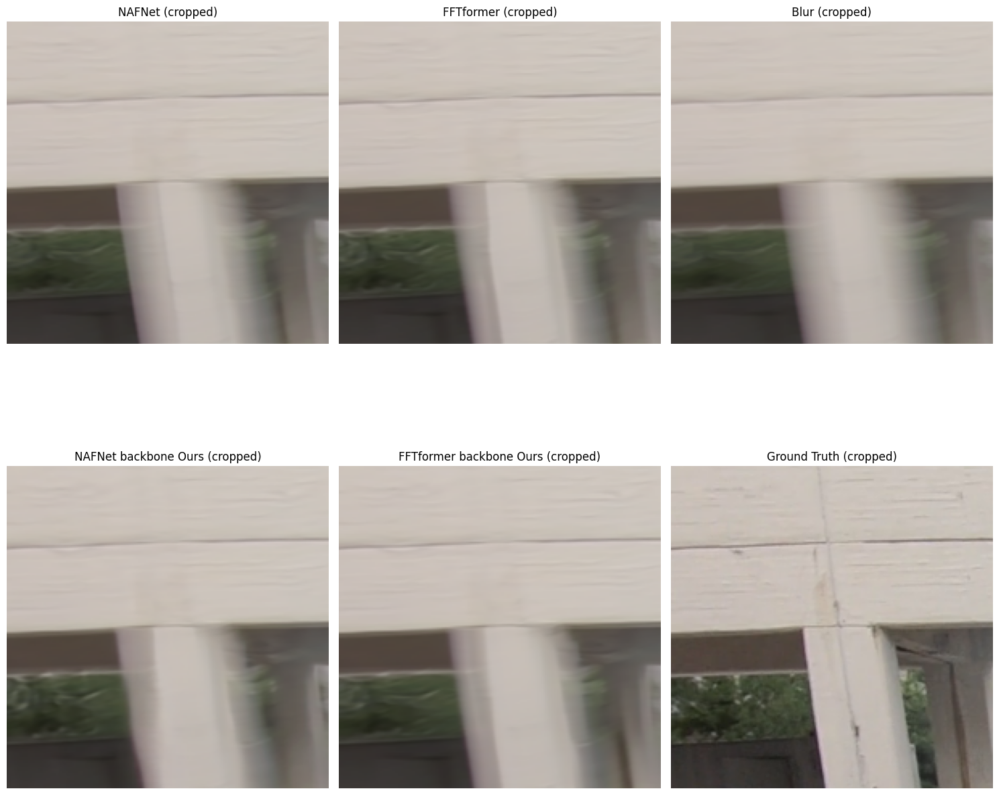

In [25]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

scene = '005'
index = '00000091'

NAF_path = f'/workspace/FFTformer/results/REDS/NAFNet/{scene}_{index}.png'
NAF_ours_path = f'/workspace/FFTformer/results/REDS/NAFNet_event_gen/{scene}_{index}/out.png'

fft_path = f'/workspace/FFTformer/results/REDS/FFTformer/{scene}_{index}.png'
ours_path = f'/workspace/FFTformer/results/REDS/FFTformer_event_gen_fftloss/{scene}_{index}/out.png'
gt_path = f'/workspace/data/REDS/val/val_sharp/{scene}/{index}.png'
blur_path = gt_path.replace('sharp','blur')




fft_psnr= caculate_PSNR(fft_path,gt_path)
fft_ours_psnr= caculate_PSNR(ours_path, gt_path)
NAF_psnr= caculate_PSNR(NAF_path, gt_path)
NAF_ours_psnr = caculate_PSNR(NAF_ours_path, gt_path)


gt_img = Image.open(gt_path).convert('RGB')
fft_img = Image.open(fft_path).convert('RGB')
ours_img = Image.open(ours_path).convert('RGB')
blur_img = Image.open(blur_path).convert('RGB')
NAF_img = Image.open(NAF_path).convert('RGB')
NAF_ours_img = Image.open(NAF_ours_path).convert('RGB')
gt_img.save('gt.png')

# Define the box coordinates (x, y, width, height)
box_coords = [130,10, 200, 200]  # Adjust these values as needed

# Convert PIL images to numpy arrays
gt_arr = np.array(gt_img)
fft_arr = np.array(fft_img) 
ours_arr = np.array(ours_img)
blur_arr = np.array(blur_img)
NAF_arr = np.array(NAF_img)
NAF_ours_arr = np.array(NAF_ours_img)

# Crop the regions
x, y, w, h = box_coords
gt_crop = gt_arr[y:y+h, x:x+w]
fft_crop = fft_arr[y:y+h, x:x+w]
ours_crop = ours_arr[y:y+h, x:x+w]
blur_crop = blur_arr[y:y+h, x:x+w]
NAF_crop = NAF_arr[y:y+h, x:x+w]
NAF_ours_crop = NAF_ours_arr[y:y+h, x:x+w]

fig, axes = plt.subplots(2, 3, figsize=(15, 12))

# Plot full images with boxes
axes[0,0].imshow(NAF_img)
axes[0,0].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[0,0].set_title(f'NAFNet ({NAF_psnr:.3f})')
axes[0,0].axis('off')

axes[1,0].imshow(NAF_ours_img)
axes[1,0].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[1,0].set_title(f'NAF backbone Ours ({NAF_ours_psnr:.3f})')
axes[1,0].axis('off')


axes[0,1].imshow(fft_img)
axes[0,1].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[0,1].set_title(f'FFTformer ({fft_psnr:.3f})')
axes[0,1].axis('off')

axes[1,1].imshow(ours_img)
axes[1,1].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[1,1].set_title(f'FFTformer backbone Ours ({fft_ours_psnr:.3f})')
axes[1,1].axis('off')

axes[0,2].imshow(blur_img)
axes[0,2].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[0,2].set_title(f'Blur ({scene}_{index})')
axes[0,2].axis('off')

axes[1,2].imshow(gt_img)
axes[1,2].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[1,2].set_title('Ground Truth')
axes[1,2].axis('off')

plt.tight_layout()
plt.show()

# Plot cropped regions
fig, axes = plt.subplots(2, 3, figsize=(15, 15))
axes[0,0].imshow(NAF_crop)
axes[0,0].set_title(f'NAFNet (cropped)')
axes[0,0].axis('off')

axes[1,0].imshow(NAF_ours_crop)
axes[1,0].set_title(f'NAFNet backbone Ours (cropped)')
axes[1,0].axis('off')

axes[0,1].imshow(fft_crop)
axes[0,1].set_title(f'FFTformer (cropped)')
axes[0,1].axis('off')

axes[1,1].imshow(ours_crop)
axes[1,1].set_title(f'FFTformer backbone Ours (cropped)')
axes[1,1].axis('off')

axes[0,2].imshow(blur_crop)
axes[0,2].set_title(f'Blur (cropped)')
axes[0,2].axis('off')

axes[1,2].imshow(gt_crop)
axes[1,2].set_title('Ground Truth (cropped)')
axes[1,2].axis('off')

plt.tight_layout()
plt.show()


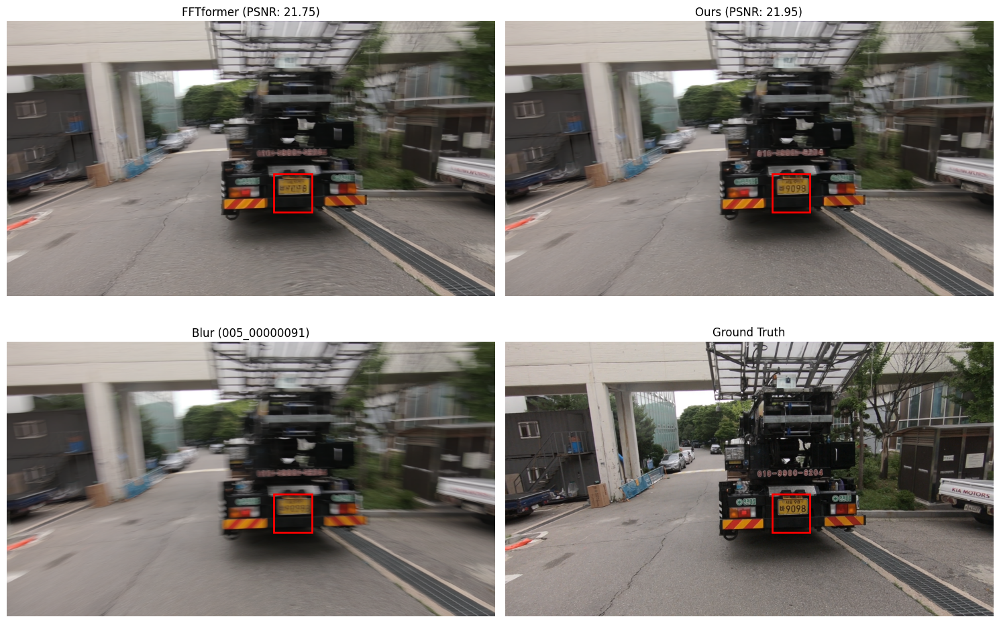

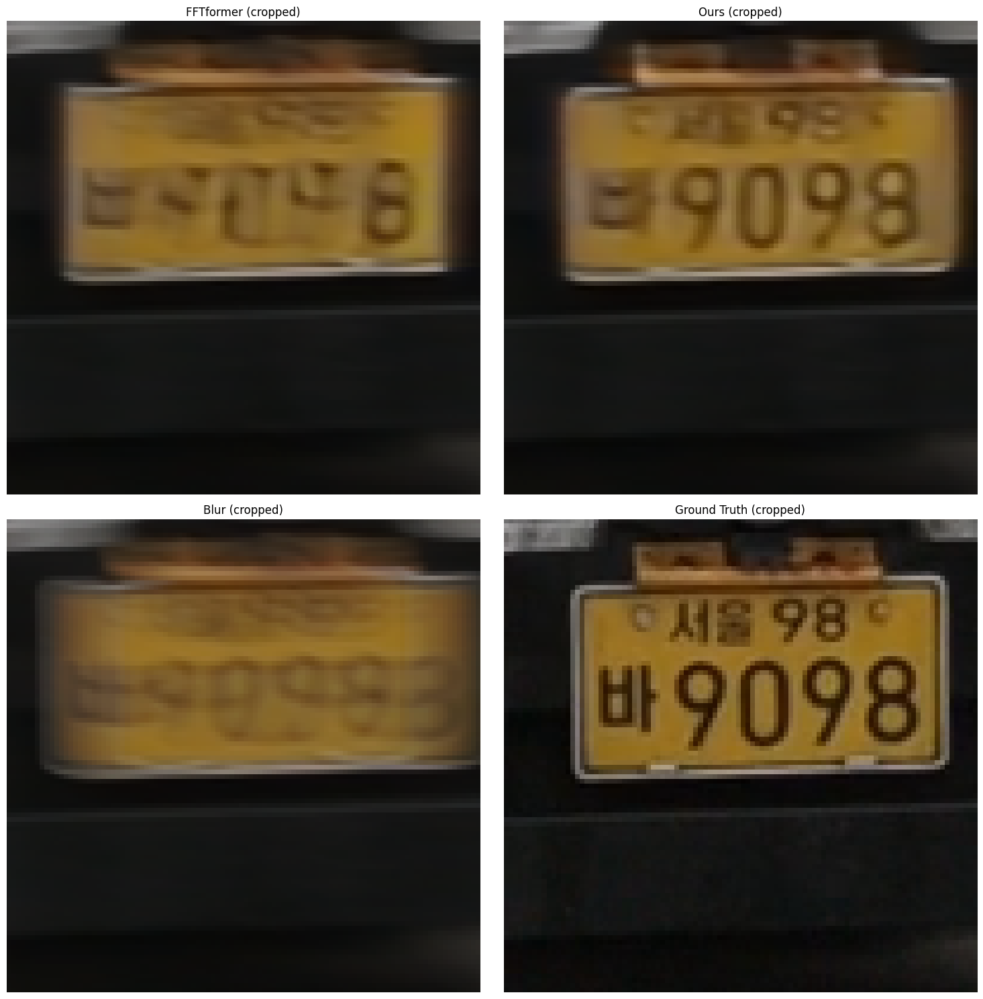

21.74673236295895 21.95445078127106


In [16]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

scene = '005'
index = '00000091'

fft_path = f'/workspace/FFTformer/results/REDS/FFTformer/{scene}_{index}.png'
ours_path = f'/workspace/FFTformer/results/REDS/FFTformer_event_gen_fftloss/{scene}_{index}/out.png'
gt_path = f'/workspace/data/REDS/val/val_sharp/{scene}/{index}.png'
blur_path = gt_path.replace('sharp','blur')

fft_score = caculate_PSNR(fft_path, gt_path)
ours_score = caculate_PSNR(ours_path, gt_path)

gt_img = Image.open(gt_path).convert('RGB')
fft_img = Image.open(fft_path).convert('RGB')
ours_img = Image.open(ours_path).convert('RGB')
blur_img = Image.open(blur_path).convert('RGB')

# Define box coordinates (x, y, width, height)
box_coords = [700, 400, 100, 100]  # Adjust these values as needed

# Get cropped regions
fft_crop = np.array(fft_img)[box_coords[1]:box_coords[1]+box_coords[3], 
                            box_coords[0]:box_coords[0]+box_coords[2]]
ours_crop = np.array(ours_img)[box_coords[1]:box_coords[1]+box_coords[3],
                              box_coords[0]:box_coords[0]+box_coords[2]]
blur_crop = np.array(blur_img)[box_coords[1]:box_coords[1]+box_coords[3],
                              box_coords[0]:box_coords[0]+box_coords[2]]
gt_crop = np.array(gt_img)[box_coords[1]:box_coords[1]+box_coords[3],
                          box_coords[0]:box_coords[0]+box_coords[2]]

# Plot full images with boxes
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes[0,0].imshow(fft_img)
axes[0,0].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3],
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[0,0].set_title(f'FFTformer (PSNR: {fft_score:.2f})')
axes[0,0].axis('off')

axes[0,1].imshow(ours_img)
axes[0,1].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3],
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[0,1].set_title(f'Ours (PSNR: {ours_score:.2f})')
axes[0,1].axis('off')

axes[1,0].imshow(blur_img)
axes[1,0].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3],
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[1,0].set_title(f'Blur ({scene}_{index})')
axes[1,0].axis('off')

axes[1,1].imshow(gt_img)
axes[1,1].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3],
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[1,1].set_title('Ground Truth')
axes[1,1].axis('off')

plt.tight_layout()
plt.show()

# Plot cropped regions
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
axes[0,0].imshow(fft_crop)
axes[0,0].set_title(f'FFTformer (cropped)')
axes[0,0].axis('off')

axes[0,1].imshow(ours_crop)
axes[0,1].set_title(f'Ours (cropped)')
axes[0,1].axis('off')

axes[1,0].imshow(blur_crop)
axes[1,0].set_title(f'Blur (cropped)')
axes[1,0].axis('off')

axes[1,1].imshow(gt_crop)
axes[1,1].set_title('Ground Truth (cropped)')
axes[1,1].axis('off')

plt.tight_layout()
plt.show()

print(fft_score,ours_score)

# RealBlur-J Outputs path

In [6]:
import os

mother_path = '/workspace/FFTformer/results/RealBlur-J/FFTformer'
scenes = os.listdir(mother_path)
scenes.sort()

with open('/workspace/FFTformer/datasets/outputs/FFTformer_realblur-j.txt', 'a') as file:
    for scene in scenes:
        scene_path = os.path.join(mother_path, scene)
        out_img_path = os.path.join(scene_path, 'out.png')
        file.write(f'{out_img_path}\n')

    


# RealBlur-R

In [6]:
txt_file_path = '/workspace/data/RealBlur/RealBlur_R_test_list.txt'

with open(txt_file_path, 'r') as file:
    lines = file.readlines()


with open('datasets/event_gen/realblur-r.txt', 'a') as file:
    for line in lines:
        gt, blur = line.split()
        file.write(f'/workspace/data/RealBlur/{blur}\n')

with open('datasets/event_gen/realblur-r_gt.txt', 'a') as file:
    for line in lines:
        gt, blur = line.split()
        file.write(f'/workspace/data/RealBlur/{gt}\n')



# RSblur NAFNet backbone

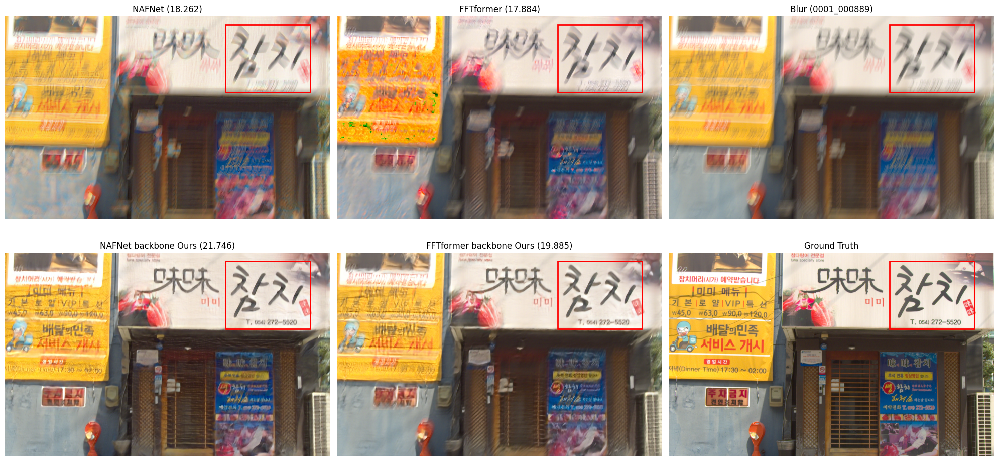

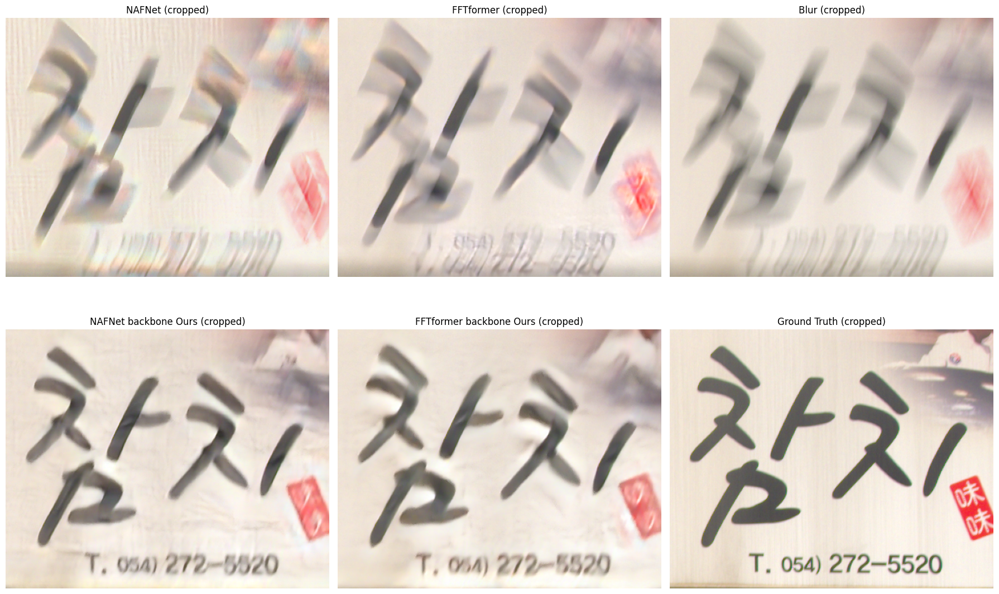

In [20]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

scene = '0001'
index = '000889'

NAF_ours_path = f'/workspace/FFTformer/results/RSblur/NAFNet_event_gen_fftloss/{scene}_{index}/out.png'
NAF_path = f'/workspace/FFTformer/results/RSblur/NAFNet/{scene}_{index}.png'

FFT_ours_path = f'/workspace/FFTformer/results/RSblur/FFTformer_event_gen_fftloss/{scene}_{index}/out.png'
FFT_path = f'/workspace/FFTformer/results/RSblur/FFTformer/{scene}_{index}.png'

gt_path = f'/workspace/data/RSBlur/{scene}/{index}/gt/gt_sharp.png'
blur_path = f'/workspace/data/RSBlur/{scene}/{index}/real_blur/real_blur.png'


NAF_score = caculate_PSNR(NAF_path, gt_path)
ours_score = caculate_PSNR(NAF_ours_path, gt_path)

FFT_score = caculate_PSNR(FFT_path, gt_path)
FFT_ours_score = caculate_PSNR(FFT_ours_path, gt_path)

gt_img = Image.open(gt_path).convert('RGB')

NAF_img = Image.open(NAF_path).convert('RGB')
NAF_ours_img = Image.open(NAF_ours_path).convert('RGB')

FFT_img = Image.open(FFT_path).convert('RGB')
FFT_ours_img = Image.open(FFT_ours_path).convert('RGB')

blur_img = Image.open(blur_path).convert('RGB')
gt_img.save('gt.png')

# Define the box coordinates (x, y, width, height)
box_coords = [1300,50, 500, 400]  # Adjust these values as needed

# Convert PIL images to numpy arrays
gt_arr = np.array(gt_img)
NAF_arr = np.array(NAF_img) 
NAF_ours_arr = np.array(NAF_ours_img)
FFT_arr = np.array(FFT_img)
FFT_ours_arr = np.array(FFT_ours_img)
blur_arr = np.array(blur_img)

# Crop the regions
x, y, w, h = box_coords
gt_crop = gt_arr[y:y+h, x:x+w]

NAF_crop = NAF_arr[y:y+h, x:x+w]
NAF_ours_crop = NAF_ours_arr[y:y+h, x:x+w]

FFT_crop = FFT_arr[y:y+h, x:x+w]
FFT_ours_crop = FFT_ours_arr[y:y+h, x:x+w]

blur_crop = blur_arr[y:y+h, x:x+w]

fig, axes = plt.subplots(2,3, figsize=(20, 10))

# Plot full images with boxes
axes[0,0].imshow(NAF_img)
axes[0,0].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[0,0].set_title(f'NAFNet ({NAF_score:.3f})')
axes[0,0].axis('off')

axes[1,0].imshow(NAF_ours_img)
axes[1,0].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[1,0].set_title(f'NAFNet backbone Ours ({ours_score:.3f})')
axes[1,0].axis('off')

axes[0,1].imshow(FFT_img)
axes[0,1].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[0,1].set_title(f'FFTformer ({FFT_score:.3f})')
axes[0,1].axis('off')

axes[1,1].imshow(FFT_ours_img)
axes[1,1].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[1,1].set_title(f'FFTformer backbone Ours ({FFT_ours_score:.3f})')
axes[1,1].axis('off')

axes[0,2].imshow(blur_img)
axes[0,2].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[0,2].set_title(f'Blur ({scene}_{index})')
axes[0,2].axis('off')

axes[1,2].imshow(gt_img)
axes[1,2].add_patch(Rectangle((box_coords[0], box_coords[1]), box_coords[2], box_coords[3], 
                             linewidth=2, edgecolor='red', facecolor='none'))
axes[1,2].set_title('Ground Truth')
axes[1,2].axis('off')

plt.tight_layout()
plt.show()

# Plot cropped regions
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes[0,0].imshow(NAF_crop)
axes[0,0].set_title(f'NAFNet (cropped)')
axes[0,0].axis('off')

axes[1,0].imshow(NAF_ours_crop)
axes[1,0].set_title(f'NAFNet backbone Ours (cropped)')
axes[1,0].axis('off')

axes[0,1].imshow(FFT_crop)
axes[0,1].set_title(f'FFTformer (cropped)')
axes[0,1].axis('off')

axes[1,1].imshow(FFT_ours_crop)
axes[1,1].set_title(f'FFTformer backbone Ours (cropped)')
axes[1,1].axis('off')

axes[0,2].imshow(blur_crop)
axes[0,2].set_title(f'Blur (cropped)')
axes[0,2].axis('off')

axes[1,2].imshow(gt_crop)
axes[1,2].set_title('Ground Truth (cropped)')
axes[1,2].axis('off')

plt.tight_layout()
plt.show()

blur = Image.fromarray(blur_crop)
blur.save('blur.png')  # PIL image type
gt = Image.fromarray(gt_crop)
gt.save('gt.png')
NAF_crop = Image.fromarray(NAF_crop)
NAF_crop.save('NAF_crop.png')
FFT_crop = Image.fromarray(FFT_crop)
FFT_crop.save('FFT_crop.png')

NAF_ours_crop = Image.fromarray(NAF_ours_crop)
NAF_ours_crop.save('NAF_ours.png')
FFT_ours_crop = Image.fromarray(FFT_ours_crop)
FFT_ours_crop.save('FFT_ours.png')


In [19]:
from PIL import Image, ImageDraw

# blur_img가 numpy 배열이라면 PIL 이미지로 변환)

# 사각형 그리기
draw = ImageDraw.Draw(blur_img)
box_coords = [1300, 50, 1800, 450]  # 좌표 설정 (x1, y1, x2, y2)

# 좌표를 정렬 (좌상단 -> 우하단 순서로)
x1, y1, x2, y2 = box_coords
x_min, x_max = min(x1, x2), max(x1, x2)
y_min, y_max = min(y1, y2), max(y1, y2)

# 빨간색 테두리 사각형 그리기
draw.rectangle([x_min, y_min, x_max, y_max], outline="red", width=5)

# 이미지 저장
blur_img.save('blur.png')
